In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Input, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import cv2
from glob import glob
import random
from tensorflow.keras.preprocessing.image import load_img
from IPython.display import FileLink
# from tqdm import tqdm
from tensorflow.keras.models import Model
import tensorflow.keras.backend as K
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import plot_model
from tensorflow.keras.applications import Xception
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

In [2]:
from tensorflow.keras.mixed_precision import set_global_policy

set_global_policy("mixed_float16")

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 4050 Laptop GPU, compute capability 8.9


In [3]:
dataset_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/"

# Check the class folders
classes = os.listdir(dataset_path)
print("Classes:", classes)

# Count images per class
class_counts = {cls: len(os.listdir(os.path.join(dataset_path, cls))) for cls in classes}
print("Class Distribution:", class_counts)

Classes: ['all_benign', 'all_early', 'all_pre', 'all_pro', 'brain_glioma', 'brain_menin', 'brain_notumor', 'brain_tumor', 'breast_benign', 'breast_malignant', 'cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi', 'colon_aca', 'colon_bnt', 'kidney_normal', 'kidney_tumor', 'lung_aca', 'lung_bnt', 'lung_scc', 'lymph_cll', 'lymph_fl', 'lymph_mcl', 'oral_normal', 'oral_scc']
Class Distribution: {'all_benign': 5000, 'all_early': 5000, 'all_pre': 5000, 'all_pro': 5000, 'brain_glioma': 5000, 'brain_menin': 5000, 'brain_notumor': 2000, 'brain_tumor': 5000, 'breast_benign': 5000, 'breast_malignant': 5000, 'cervix_dyk': 5000, 'cervix_koc': 5000, 'cervix_mep': 5000, 'cervix_pab': 5000, 'cervix_sfi': 5000, 'colon_aca': 5000, 'colon_bnt': 5000, 'kidney_normal': 5000, 'kidney_tumor': 5000, 'lung_aca': 5000, 'lung_bnt': 5000, 'lung_scc': 5000, 'lymph_cll': 5000, 'lymph_fl': 5000, 'lymph_mcl': 5000, 'oral_normal': 5001, 'oral_scc': 5001}


In [4]:
dataset_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/"

classes = sorted([cls for cls in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, cls))])

class_counts = {cls: len(os.listdir(os.path.join(dataset_path, cls))) for cls in classes}

df_class_distribution = pd.DataFrame(list(class_counts.items()), columns=["Class Name", "Image Count"])

df_class_distribution.insert(0, "S.No", range(1, len(df_class_distribution) + 1))

df_class_distribution = df_class_distribution.sort_values(by="Class Name").reset_index(drop=True)
df_class_distribution["S.No"] = df_class_distribution.index + 1  # Recalculate serial number after sorting

print(df_class_distribution.to_string(index=False))

 S.No       Class Name  Image Count
    1       all_benign         5000
    2        all_early         5000
    3          all_pre         5000
    4          all_pro         5000
    5     brain_glioma         5000
    6      brain_menin         5000
    7    brain_notumor         2000
    8      brain_tumor         5000
    9    breast_benign         5000
   10 breast_malignant         5000
   11       cervix_dyk         5000
   12       cervix_koc         5000
   13       cervix_mep         5000
   14       cervix_pab         5000
   15       cervix_sfi         5000
   16        colon_aca         5000
   17        colon_bnt         5000
   18    kidney_normal         5000
   19     kidney_tumor         5000
   20         lung_aca         5000
   21         lung_bnt         5000
   22         lung_scc         5000
   23        lymph_cll         5000
   24         lymph_fl         5000
   25        lymph_mcl         5000
   26      oral_normal         5001
   27         oral_scc      

In [5]:
file_paths = []
labels = []

for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    for file in os.listdir(cls_folder):
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):  
            file_paths.append(os.path.join(cls_folder, file))
            labels.append(cls)

df = pd.DataFrame({
    'file_path': file_paths,
    'label': labels
})

df = df.sample(frac=1, random_state=42).reset_index(drop=True)

print(df)


                                                file_path             label
0       Multi_Class_p1/Multi Cancer/Unified_Classes/br...  breast_malignant
1       Multi_Class_p1/Multi Cancer/Unified_Classes/al...           all_pro
2       Multi_Class_p1/Multi Cancer/Unified_Classes/br...     breast_benign
3       Multi_Class_p1/Multi Cancer/Unified_Classes/lu...          lung_aca
4       Multi_Class_p1/Multi Cancer/Unified_Classes/al...           all_pre
...                                                   ...               ...
131997  Multi_Class_p1/Multi Cancer/Unified_Classes/ly...         lymph_cll
131998  Multi_Class_p1/Multi Cancer/Unified_Classes/ly...         lymph_mcl
131999  Multi_Class_p1/Multi Cancer/Unified_Classes/lu...          lung_scc
132000  Multi_Class_p1/Multi Cancer/Unified_Classes/or...          oral_scc
132001  Multi_Class_p1/Multi Cancer/Unified_Classes/ly...         lymph_mcl

[132002 rows x 2 columns]


In [6]:
# from sklearn.preprocessing import LabelEncoder

# label_encoder = LabelEncoder()

# df['label_encoded'] = label_encoder.fit_transform(df['label'])

# label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
# print("Label Mapping:", label_mapping)

# print(df.head())


# Visualization

C:\Users\saish\AppData\Local\Temp\ipykernel_23308\1944107415.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='label', order=df['label'].value_counts().index, palette='viridis')


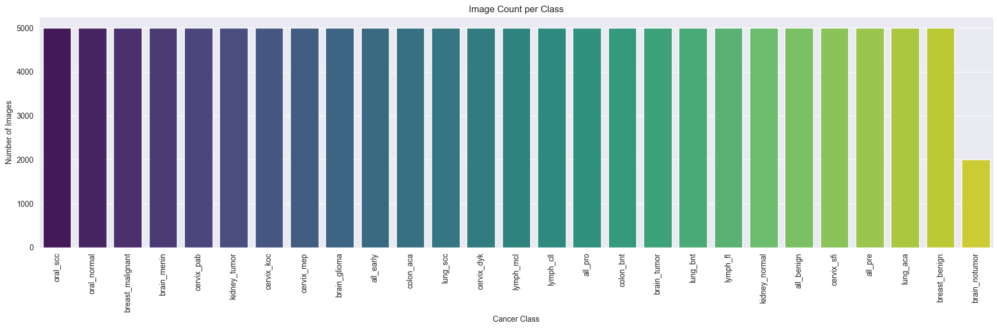

In [7]:
plt.figure(figsize=(18, 6))
sns.countplot(data=df, x='label', order=df['label'].value_counts().index, palette='viridis')
plt.xticks(rotation=90)
plt.title('Image Count per Class')
plt.xlabel('Cancer Class')
plt.ylabel('Number of Images')
plt.tight_layout()
plt.show()


C:\Users\saish\AppData\Local\Temp\ipykernel_23308\2493332169.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sample_per_class = df.groupby('label').apply(lambda x: x.sample(1)).reset_index(drop=True)


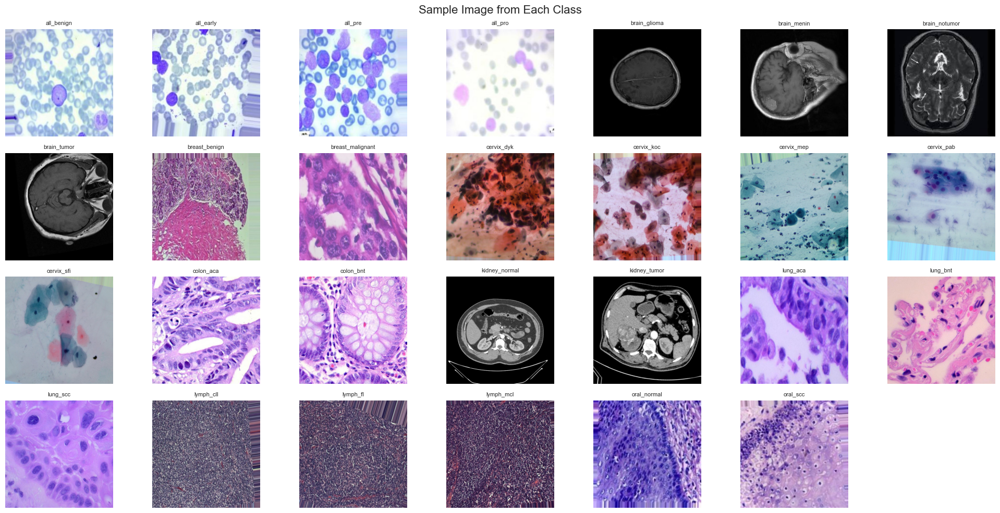

In [8]:
import random
from PIL import Image

# Display one random image from each class
sample_per_class = df.groupby('label').apply(lambda x: x.sample(1), include_groups=False).reset_index(drop=True)

plt.figure(figsize=(20, 10))
for idx, row in enumerate(sample_per_class.itertuples()):
    img = Image.open(row.file_path)
    plt.subplot(4, 7, idx + 1)  # 27 classes (4x7 grid)
    plt.imshow(img)
    plt.axis('off')
    plt.title(row.label, fontsize=8)

plt.suptitle("Sample Image from Each Class", fontsize=16)
plt.tight_layout()
plt.show()


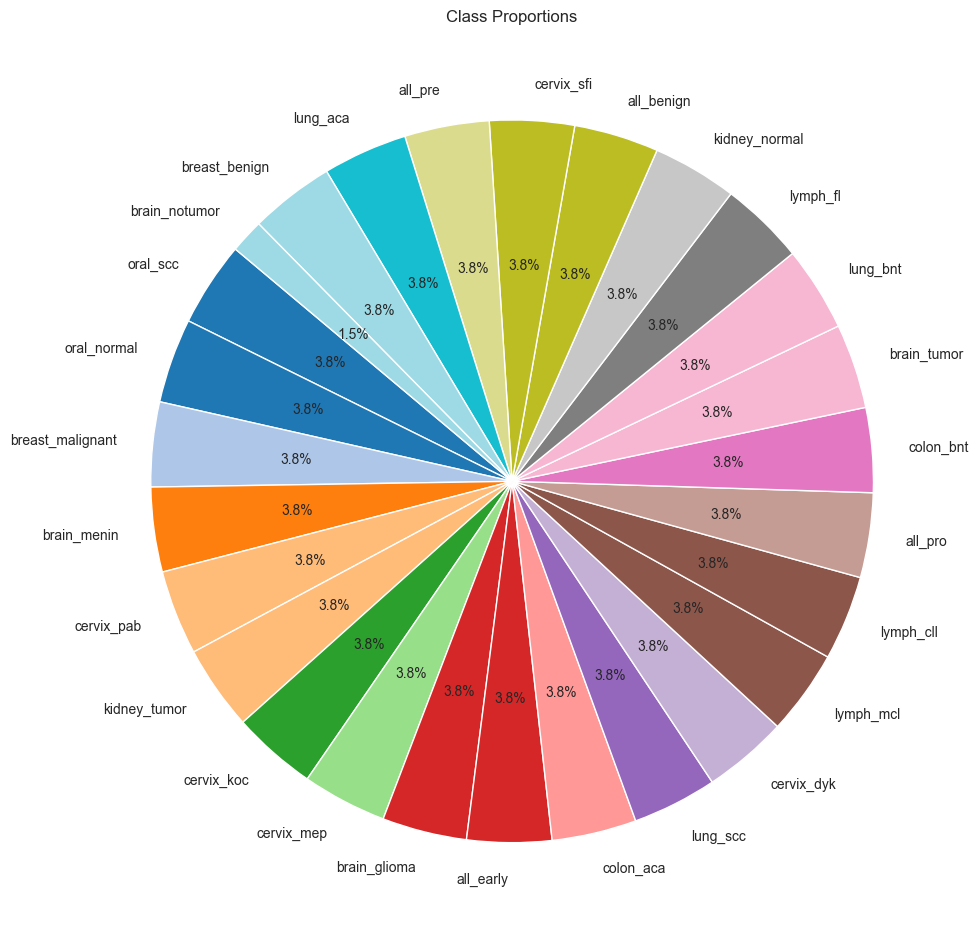

In [9]:
plt.figure(figsize=(10, 10))
df['label'].value_counts().plot.pie(autopct='%1.1f%%', startangle=140, cmap='tab20')
plt.title("Class Proportions")
plt.ylabel('')
plt.tight_layout()
plt.show()


# Data Augmentation

In [10]:

train_datagen = ImageDataGenerator(
     rescale=1./255,                 # Normalize pixel values to [0, 1]
    rotation_range=10,             # Rotate max 10 degrees
    width_shift_range=0.1,         # Shift width by max 10%
    height_shift_range=0.1,        # Shift height by max 10%
    shear_range=0.05,              # Slight shearing
    zoom_range=0.1,                # Max 10% zoom in/out
    horizontal_flip=True,          # Still useful for symmetry-based tasks
    brightness_range=[0.8, 1.2],   # Controlled brightness adjustment
    fill_mode="nearest",
    validation_split=0.2
)

test_datagen = ImageDataGenerator(rescale=1./255,
                                 validation_split=0.1)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 validation_split=0.2)

IMAGE_SIZE = (224, 224)
BATCH_SIZE = 16 # or 32

train_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    dataset_path,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
   dataset_path,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)


Found 105602 images belonging to 27 classes.
Found 26400 images belonging to 27 classes.
Found 13200 images belonging to 27 classes.


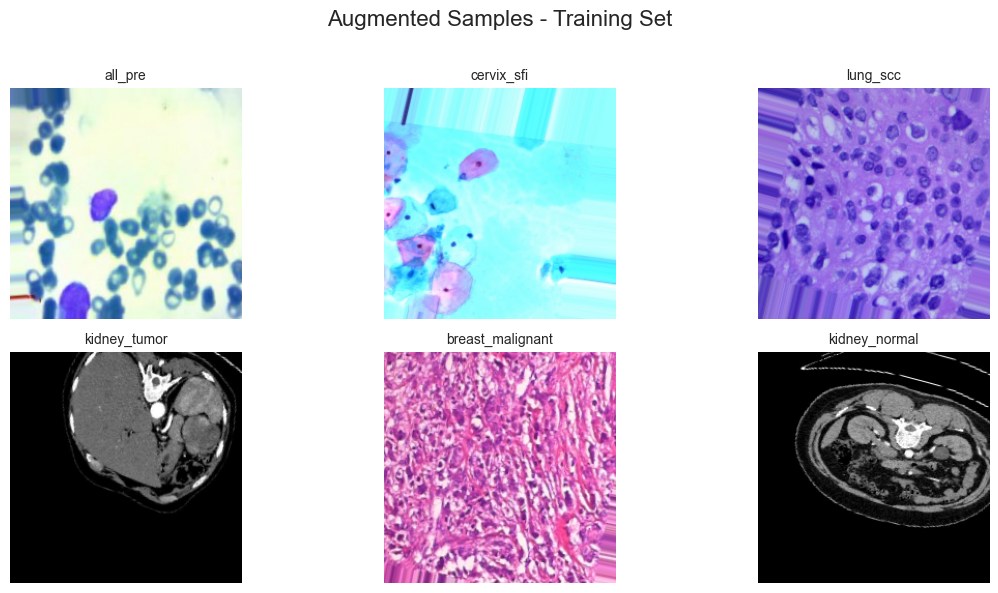

In [11]:

def plot_sample_images(generator, title, num_images=6):
    images, labels = next(generator)  # Get one batch
    class_names = list(generator.class_indices.keys())
    
    plt.figure(figsize=(12, 6))
    plt.suptitle(f"Augmented Samples - {title}", fontsize=16)
    
    for i in range(num_images):
        plt.subplot(2, num_images // 2, i + 1)
        plt.imshow(images[i])
        label_idx = np.argmax(labels[i])
        plt.title(class_names[label_idx], fontsize=10)
        plt.axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

# Plot images
plot_sample_images(train_generator, "Training Set")


# Xception

In [12]:
# # input_shape = (224, 224, 3)
# num_classes = train_generator.num_classes  # Automatically detects number of folders (classes)
#
# base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# base_model.trainable = False  # Freeze the base model for now
#
# x = base_model.output
# x = GlobalAveragePooling2D()(x)
# x = BatchNormalization()(x)
# x = Dropout(0.5)(x)
# x = Dense(512, activation='relu')(x)
# x = Dropout(0.3)(x)
# output = Dense(num_classes, activation='softmax', dtype='float32')(x)  # Use float32 due to mixed precision
#
# model = Model(inputs=base_model.input, outputs=output)
#
# # Compile the model
# model.compile(optimizer=Adam(learning_rate=1e-5),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])
#


In [13]:
num_classes = train_generator.num_classes

base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Enable full fine-tuning
base_model.trainable = True

# Add custom top layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(num_classes, activation='softmax', dtype='float32')(x)

# Construct the full model
model = Model(inputs=base_model.input, outputs=output)

# Compile with a lower learning rate for fine-tuning
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [14]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                             

In [15]:
# plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

In [16]:
# plot_model(model, to_file='model_architecture.pdf', show_shapes=True, show_layer_names=True)

In [17]:
# Callbacks
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5, # or 3
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.3,
    patience=3,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath='Xception_model.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Combine callbacks
callbacks = [early_stop, reduce_lr, checkpoint]


In [18]:
# Train the model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=50,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/50
6601/6601 [==============================] - ETA: 0s - loss: 0.9961 - accuracy: 0.6853
Epoch 1: val_loss improved from inf to 0.19747, saving model to Xception_model.keras
6601/6601 [==============================] - 2213s 334ms/step - loss: 0.9961 - accuracy: 0.6853 - val_loss: 0.1975 - val_accuracy: 0.9227 - lr: 1.0000e-05
Epoch 2/50
6601/6601 [==============================] - ETA: 0s - loss: 0.2740 - accuracy: 0.9007
Epoch 2: val_loss improved from 0.19747 to 0.08346, saving model to Xception_model.keras
6601/6601 [==============================] - 1758s 266ms/step - loss: 0.2740 - accuracy: 0.9007 - val_loss: 0.0835 - val_accuracy: 0.9698 - lr: 1.0000e-05
Epoch 3/50
6601/6601 [==============================] - ETA: 0s - loss: 0.1588 - accuracy: 0.9422
Epoch 3: val_loss improved from 0.08346 to 0.04411, saving model to Xception_model.keras
6601/6601 [==============================] - 1694s 257ms/step - loss: 0.1588 - accuracy: 0.9422 - val_loss: 0.0441 - val_accuracy: 0.

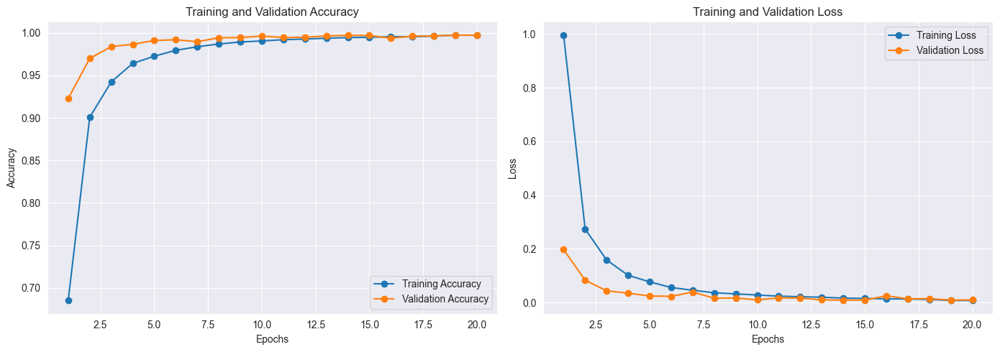

In [19]:
# Plot accuracy & loss
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy', marker='o')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy', marker='o')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.grid(True)

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss', marker='o')
    plt.plot(epochs_range, val_loss, label='Validation Loss', marker='o')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Call the function
plot_history(history)


# Testing

In [20]:
# Evaluate the model on test data
test_loss, test_accuracy = model.evaluate(test_generator, verbose=1)
print(f"\n Test Accuracy: {test_accuracy:.4f}")
print(f" Test Loss: {test_loss:.4f}")


825/825 [==============================] - 31s 37ms/step - loss: 0.0050 - accuracy: 0.9980

 Test Accuracy: 0.9980
 Test Loss: 0.0050


825/825 [==============================] - 30s 36ms/step


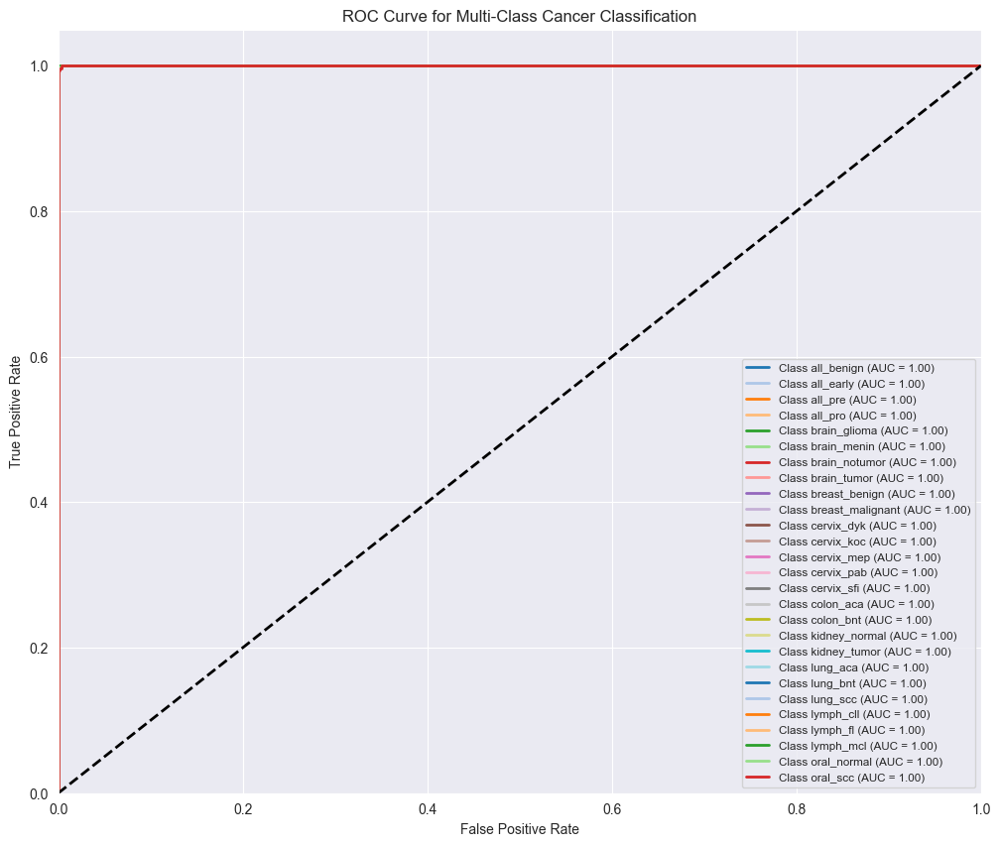

In [22]:
y_true = test_generator.classes
y_pred_proba = model.predict(test_generator)

y_true_bin = label_binarize(y_true, classes=range(num_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_pred_proba.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure(figsize=(12, 10))

colors = cycle(plt.cm.tab20.colors)  # Use 20 distinct colors
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'Class {classes[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], "k--", lw=2)  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Multi-Class Cancer Classification")
plt.legend(loc="lower right", fontsize='small')
plt.grid(True)
plt.show()

In [23]:

Y_pred = model.predict(test_generator)
y_pred = np.argmax(Y_pred, axis=1)
y_true = test_generator.classes

print(classification_report(y_true, y_pred, target_names=test_generator.class_indices.keys()))


825/825 [==============================] - 33s 40ms/step
                  precision    recall  f1-score   support

      all_benign       1.00      1.00      1.00       500
       all_early       1.00      1.00      1.00       500
         all_pre       1.00      1.00      1.00       500
         all_pro       1.00      1.00      1.00       500
    brain_glioma       1.00      1.00      1.00       500
     brain_menin       1.00      1.00      1.00       500
   brain_notumor       1.00      1.00      1.00       200
     brain_tumor       1.00      1.00      1.00       500
   breast_benign       0.99      1.00      0.99       500
breast_malignant       1.00      0.99      0.99       500
      cervix_dyk       1.00      1.00      1.00       500
      cervix_koc       1.00      1.00      1.00       500
      cervix_mep       1.00      1.00      1.00       500
      cervix_pab       1.00      1.00      1.00       500
      cervix_sfi       1.00      1.00      1.00       500
       colon_a

825/825 [==============================] - 28s 33ms/step


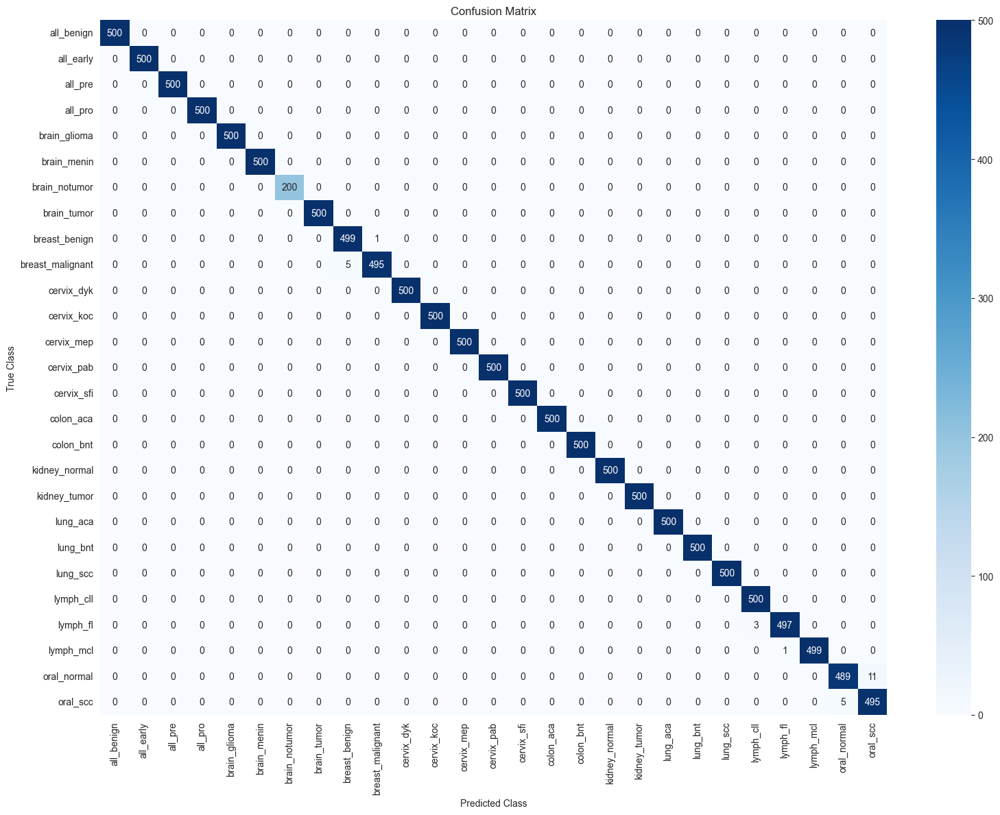

In [24]:
Y_pred = model.predict(test_generator, verbose=1)
y_pred = np.argmax(Y_pred, axis=1)

# Step 2: Get true labels
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

cm = confusion_matrix(y_true, y_pred)

# Step 5: Plot Confusion Matrix
plt.figure(figsize=(16, 12))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [25]:

def predict_random_images(test_dir, model, class_labels, image_size=(224, 224), num_images=10):
    # Gather all image paths
    all_images = []
    for cls in os.listdir(test_dir):
        cls_path = os.path.join(test_dir, cls)
        if os.path.isdir(cls_path):
            for fname in os.listdir(cls_path):
                if fname.lower().endswith(('jpg', 'jpeg', 'png')):
                    all_images.append((os.path.join(cls_path, fname), cls))

    # Randomly select N images
    selected_images = random.sample(all_images, num_images)

    plt.figure(figsize=(20, 5))

    for i, (img_path, true_label) in enumerate(selected_images):
        img = image.load_img(img_path, target_size=image_size)
        img_array = image.img_to_array(img) / 255.0
        img_array = np.expand_dims(img_array, axis=0)

        prediction = model.predict(img_array)
        pred_index = np.argmax(prediction)
        pred_label = class_labels[pred_index]

        plt.subplot(2, num_images // 2, i + 1)
        plt.imshow(img)
        plt.axis('off')
        color = "green" if pred_label == true_label else "red"
        plt.title(f"True: {true_label}\nPred: {pred_label}", color=color, fontsize=10)

    plt.tight_layout()
    plt.show()


1/1 [==============================] - 0s 16ms/step


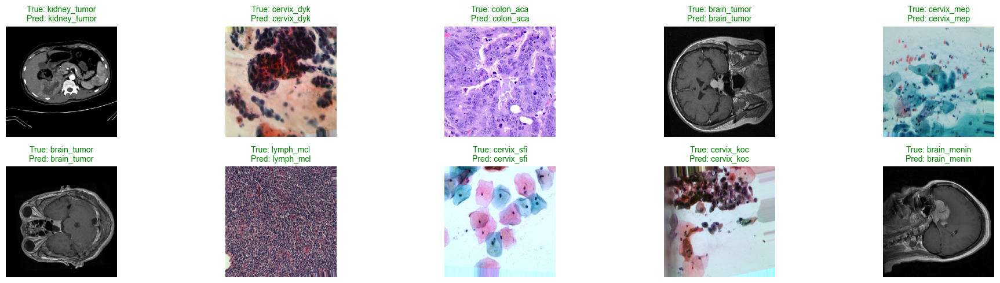

In [26]:
test_dir = os.path.join(dataset_path)
class_labels = list(test_generator.class_indices.keys())
predict_random_images(test_dir, model, class_labels, num_images=10)

In [27]:
def predict_with_confidence_bar(img_path, model, class_labels, image_size=(224, 224)):

    img = image.load_img(img_path, target_size=image_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    prediction = model.predict(img_array)[0]
    predicted_index = np.argmax(prediction)
    predicted_label = class_labels[predicted_index]
    predicted_confidence = prediction[predicted_index]

    print(f"Predicted Label: {predicted_label}")
    print(f"Confidence: {predicted_confidence:.4f}")

    fig = plt.figure(figsize=(12, 10))  # Bigger for readability

    ax1 = fig.add_subplot(2, 1, 1)
    ax1.imshow(img)
    ax1.axis('off')
    ax1.set_title(f"Predicted: {predicted_label} ({predicted_confidence:.2%})", fontsize=18)

    ax2 = fig.add_subplot(2, 1, 2)
    y_pos = np.arange(len(class_labels))
    bars = ax2.barh(y_pos, prediction, color='dodgerblue')
    ax2.set_yticks(y_pos)
    ax2.set_yticklabels(class_labels, fontsize=12)
    ax2.set_xlabel("Confidence Score", fontsize=14)
    ax2.set_title("Model Confidence per Class", fontsize=16)
    ax2.set_xlim(0, 1.0)

    for i, bar in enumerate(bars):
        ax2.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
                 f"{prediction[i]:.2%}", va='center', fontsize=10)

    bars[predicted_index].set_color('green')

    plt.tight_layout()
    plt.show()

    return predicted_label

1/1 [==============================] - 0s 32ms/step
Predicted Label: breast_malignant
Confidence: 0.9999


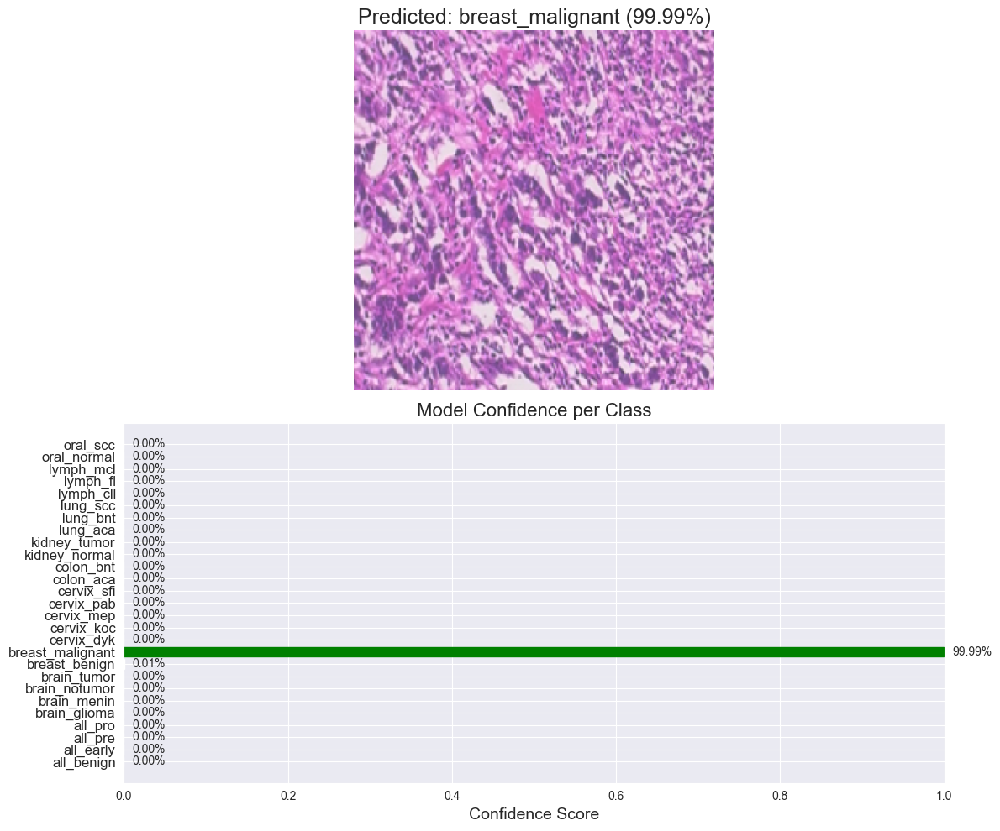

Predicted Label: breast_malignant


In [28]:
class_labels = list(test_generator.class_indices.keys())

img_path = "C:/S/Programming/Project_1/Multi_Class_p1/Multi Cancer/Unified_Classes/breast_malignant/breast_malignant_0003.jpg"
predicted = predict_with_confidence_bar(img_path, model, class_labels)
print("Predicted Label:", predicted)


1/1 [==============================] - 0s 33ms/step
Predicted Label: brain_glioma
Confidence: 1.0000


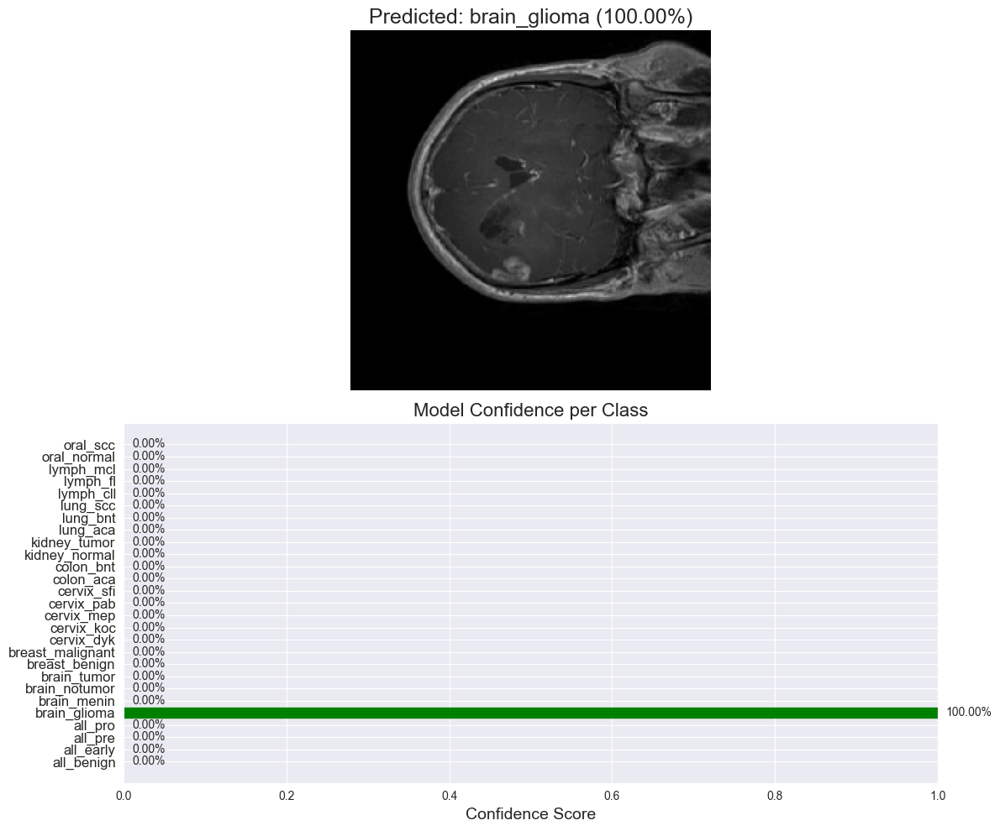

Predicted Label: brain_glioma


In [29]:
class_labels = list(test_generator.class_indices.keys())

img_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/brain_glioma/brain_glioma_0004.jpg"
predicted = predict_with_confidence_bar(img_path, model, class_labels)
print("Predicted Label:", predicted)


1/1 [==============================] - 0s 47ms/step
Predicted Label: cervix_pab
Confidence: 1.0000


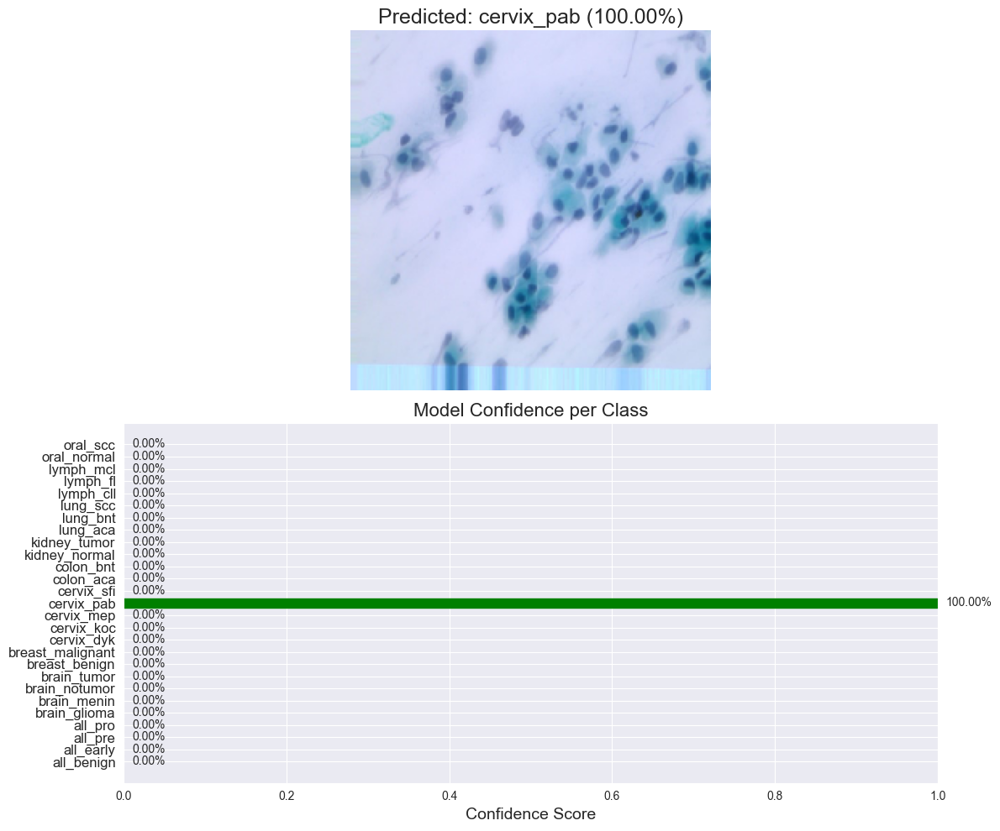

Predicted Label: cervix_pab


In [30]:
class_labels = list(test_generator.class_indices.keys())

img_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/cervix_pab/cervix_pab_0014.jpg"
predicted = predict_with_confidence_bar(img_path, model, class_labels)
print("Predicted Label:", predicted)


1/1 [==============================] - 0s 48ms/step
Predicted Label: lymph_fl
Confidence: 1.0000


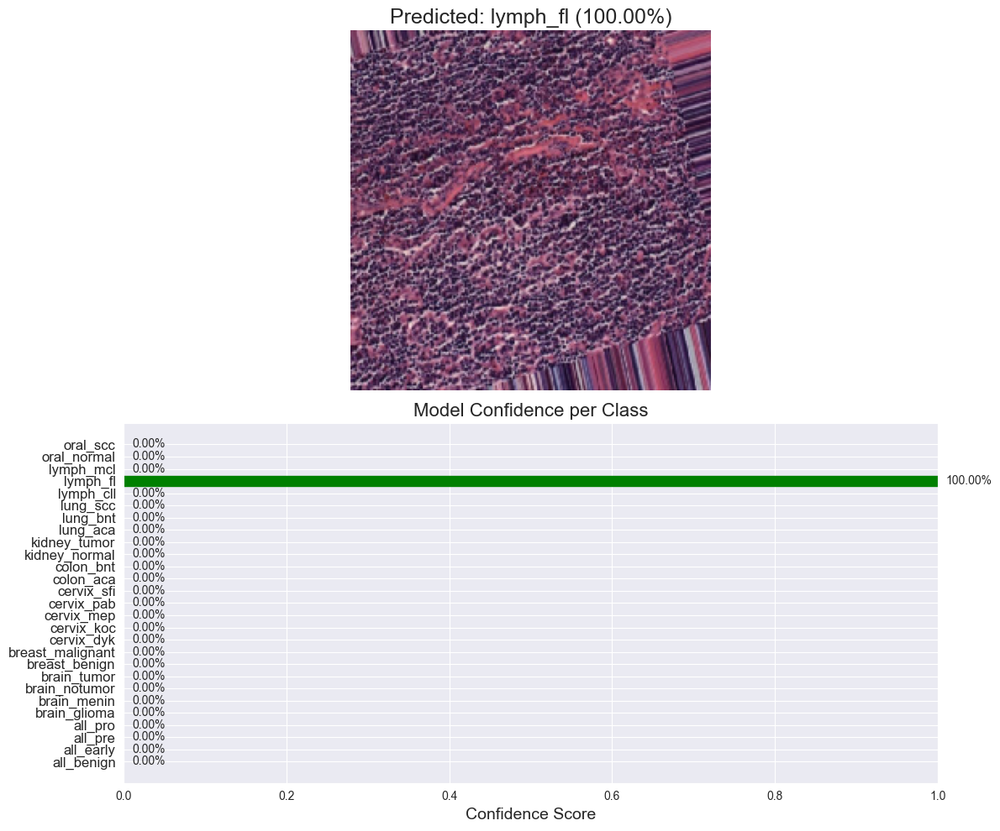

Predicted Label: lymph_fl


In [31]:
class_labels = list(test_generator.class_indices.keys())

img_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/lymph_fl/lymph_fl_0003.jpg"
predicted = predict_with_confidence_bar(img_path, model, class_labels)
print("Predicted Label:", predicted)


In [13]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.preprocessing import image
import tensorflow as tf

Available layers in model:
1. input_1
2. block1_conv1
3. block1_conv1_bn
4. block1_conv1_act
5. block1_conv2
6. block1_conv2_bn
7. block1_conv2_act
8. block2_sepconv1
9. block2_sepconv1_bn
10. block2_sepconv2_act
11. block2_sepconv2
12. block2_sepconv2_bn
13. conv2d
14. block2_pool
15. batch_normalization
16. add
17. block3_sepconv1_act
18. block3_sepconv1
19. block3_sepconv1_bn
20. block3_sepconv2_act
21. block3_sepconv2
22. block3_sepconv2_bn
23. conv2d_1
24. block3_pool
25. batch_normalization_1
26. add_1
27. block4_sepconv1_act
28. block4_sepconv1
29. block4_sepconv1_bn
30. block4_sepconv2_act
31. block4_sepconv2
32. block4_sepconv2_bn
33. conv2d_2
34. block4_pool
35. batch_normalization_2
36. add_2
37. block5_sepconv1_act
38. block5_sepconv1
39. block5_sepconv1_bn
40. block5_sepconv2_act
41. block5_sepconv2
42. block5_sepconv2_bn
43. block5_sepconv3_act
44. block5_sepconv3
45. block5_sepconv3_bn
46. add_3
47. block6_sepconv1_act
48. block6_sepconv1
49. block6_sepconv1_bn
50. block

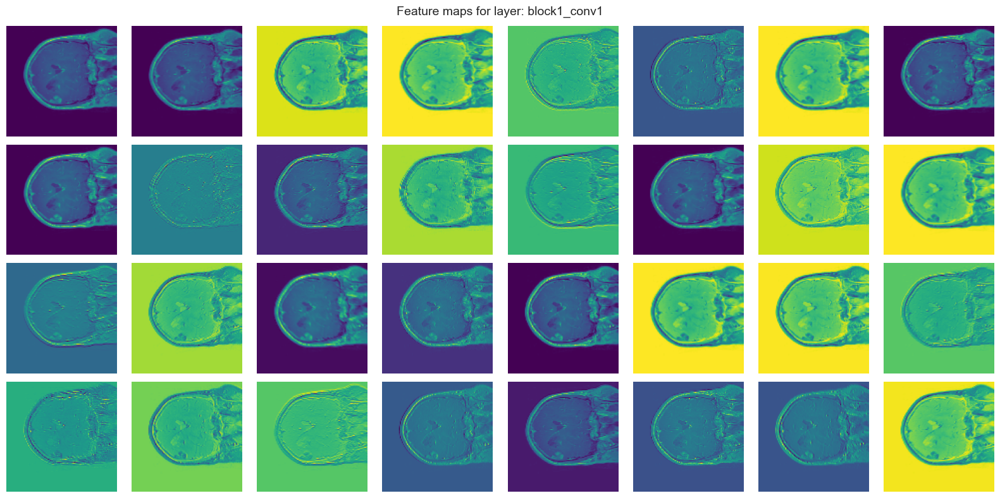

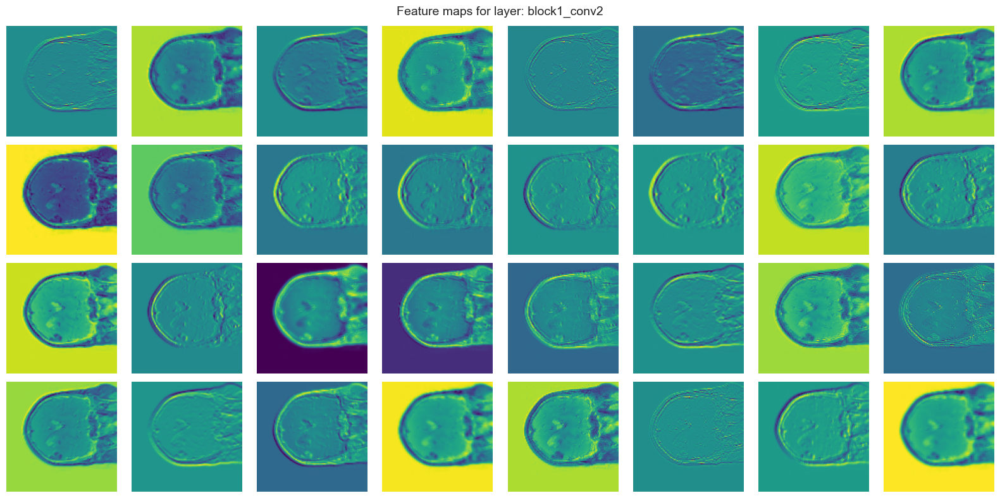

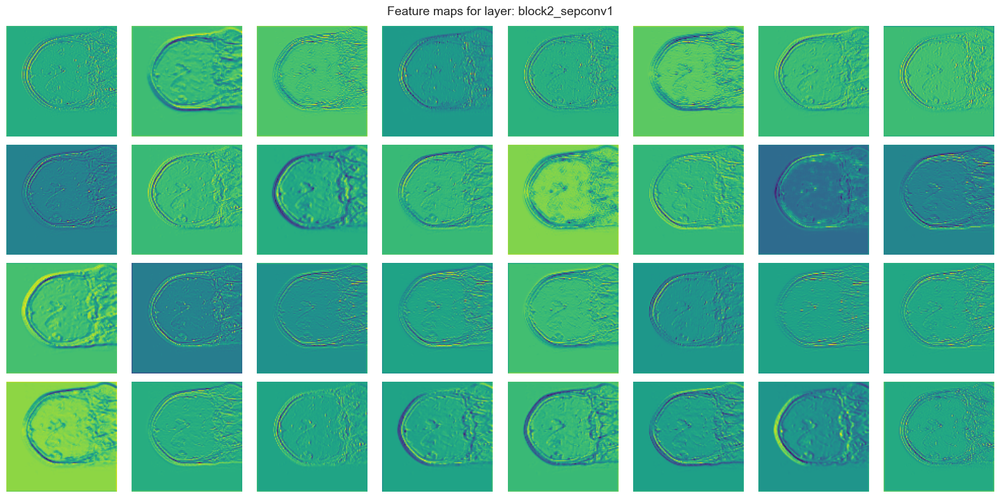

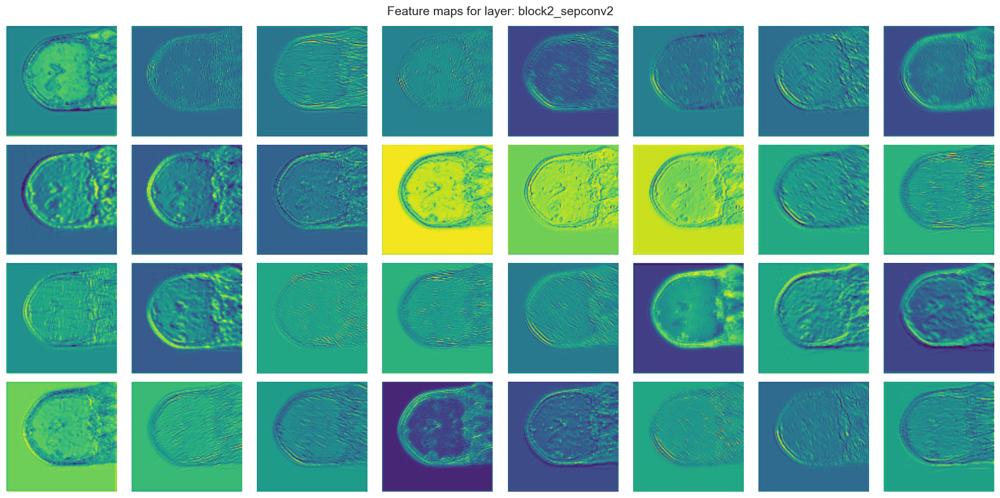

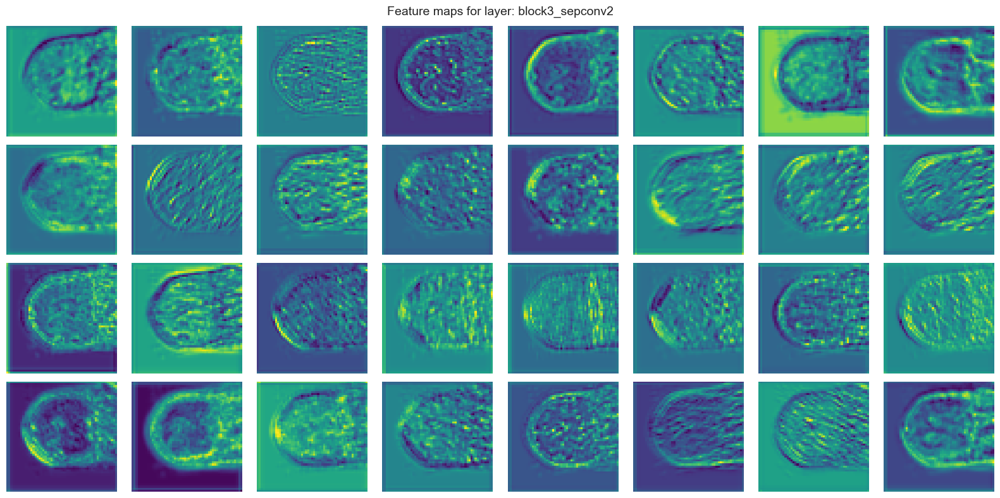

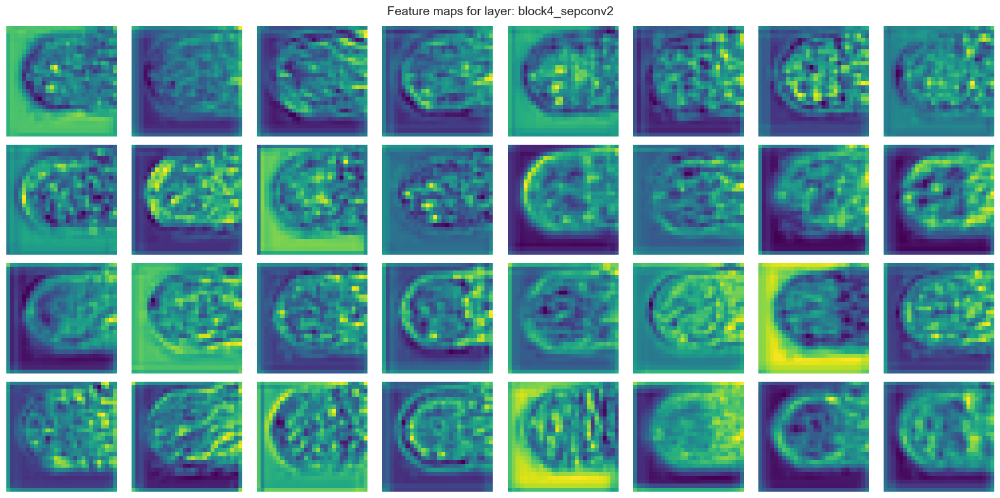

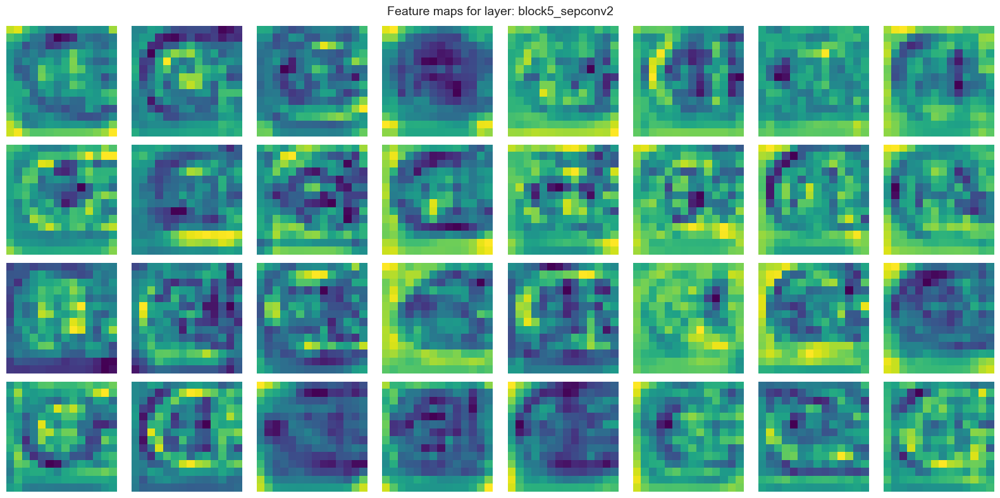

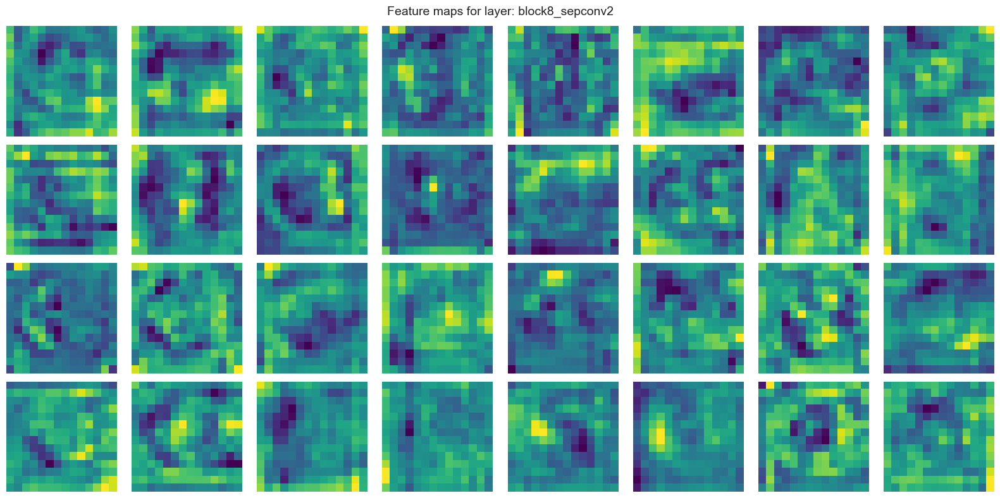

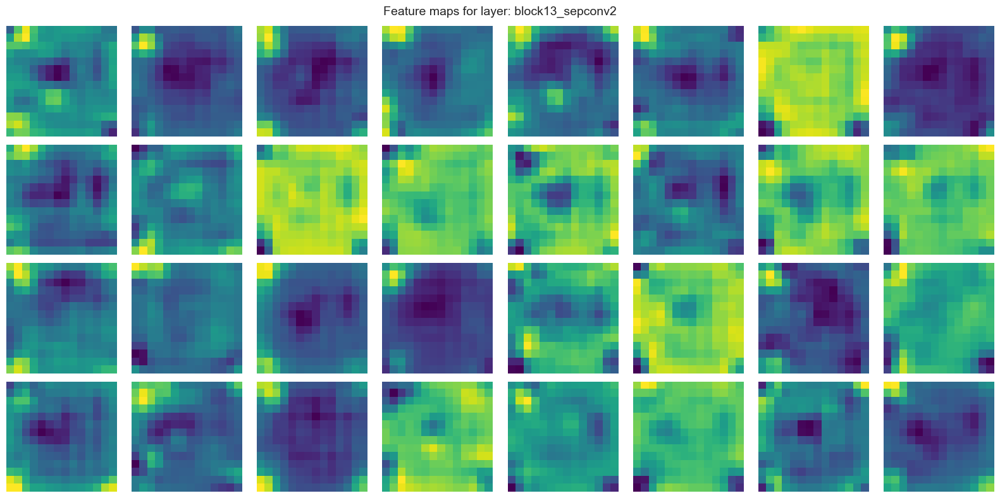

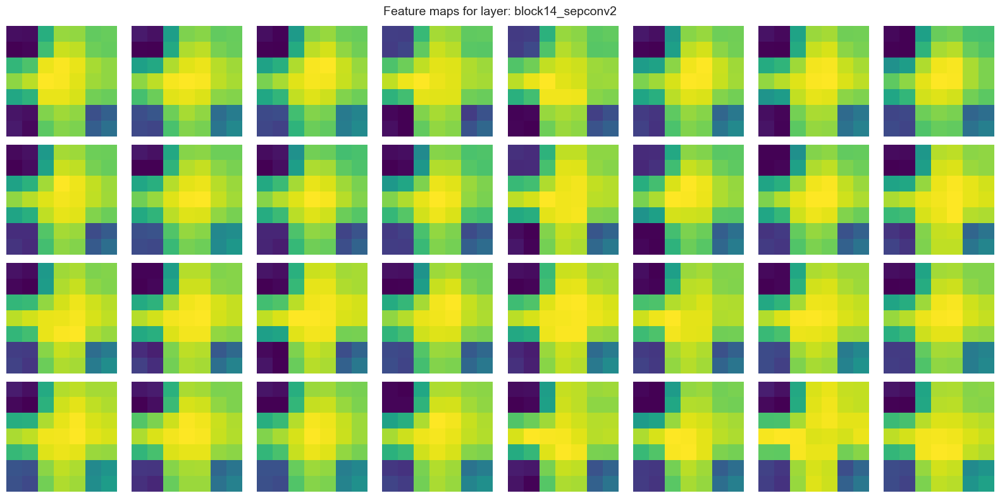

In [14]:
# Load Model
model = load_model("Xception_model.keras")

# Load and preprocess an image
img_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/brain_glioma/brain_glioma_0004.jpg"
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

# Print all layer names (optional)
print("Available layers in model:")
for i, layer in enumerate(model.layers):
    print(f"{i+1}. {layer.name}")

# Define important layers to visualize
main_layer_names = [
    'block1_conv1',
    'block1_conv2',
    'block2_sepconv1',
    'block2_sepconv2',
    'block3_sepconv2',
    'block4_sepconv2',
    'block5_sepconv2',
    'block8_sepconv2',
    'block13_sepconv2',
    'block14_sepconv2',
]

# Filter only the existing layers
layer_outputs = []
valid_layer_names = []
for layer in model.layers:
    if layer.name in main_layer_names:
        layer_outputs.append(layer.output)
        valid_layer_names.append(layer.name)

# Build model that returns outputs from selected layers
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# Predict to get the intermediate activations
activations = activation_model.predict(img_array)

# Visualize feature maps
for layer_name, layer_activation in zip(valid_layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]

    n_cols = min(8, n_features)
    n_rows = min(4, (n_features + n_cols - 1) // n_cols)

    fig = plt.figure(figsize=(n_cols * 2, n_rows * 2))
    fig.suptitle(f'Feature maps for layer: {layer_name}', fontsize=14)

    for i in range(n_rows * n_cols):
        if i < n_features:
            ax = plt.subplot(n_rows, n_cols, i + 1)
            ax.imshow(layer_activation[0, :, :, i], cmap='viridis')
            ax.axis('off')

    plt.tight_layout()
    plt.show()


# END